In [4]:
import os
from os import listdir
import pandas as pd
import numpy as np
import glob
import cv2
import json
from os.path import expanduser
import splitfolders
import shutil
from define_path import Def_Path

from tqdm import tqdm

import torch 
import torchvision
from torchvision import models
from torchvision.models.detection.rpn import AnchorGenerator
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn 
import torch.nn.functional as func
import torchvision.transforms as T
from torchvision.transforms import functional as F
from torchsummary import summary
from torch.cuda.amp import GradScaler, autocast
from sklearn.model_selection import train_test_split
from torch_geometric.nn import GCNConv, global_mean_pool
from torch_geometric.data import Data

import albumentations as A # Library for augmentations

import matplotlib.pyplot as plt 
from PIL import Image

import transforms, utils, engine, train
from utils import collate_fn
from engine import train_one_epoch, evaluate


t = torch.cuda.get_device_properties(0).total_memory
print(t)
torch.cuda.empty_cache()

r = torch.cuda.memory_reserved(0)
print(r)
a = torch.cuda.memory_allocated(0)
print(a)
# f = r-a  # free inside reserved

16908615680
0
0


In [5]:
# to generalize home directory. User can change their parent path without entering their home directory
path = Def_Path()

parent_path =  path.home + "/Pictures/" + "Data/"

root_dir = parent_path + path.year + "-" + path.month + "-" + path.day + "/"

print(root_dir)

/home/jc-merlab/Pictures/Data/2023-11-07/


In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# torch.cuda.set_per_process_memory_fraction(0.9, 0)
print(device)

cuda


In [4]:
# this fucntion tranforms an input image for diverseifying data for training
def train_transform():
    return A.Compose([
        A.Sequential([
            A.RandomRotate90(p=1), 
            A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.2, brightness_by_max=True, always_apply=False, p=1), 
        ], p=1),
        A.Resize(640, 480),  # Resize every image to 640x480 after all other transformations
    ],
    keypoint_params=A.KeypointParams(format='xy'),
    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['bboxes_labels'])
    )

In [5]:
# this function is to split the dataset into train, test and validation folder.
def train_test_split(src_dir):
    dst_dir_img = src_dir + "images"
    dst_dir_anno = src_dir + "annotations"
    
    if os.path.exists(dst_dir_img) and os.path.exists(dst_dir_anno):
        print("folders exist")
    else:
        os.mkdir(dst_dir_img)
        os.mkdir(dst_dir_anno)
        
    for jpgfile in glob.iglob(os.path.join(src_dir, "*.jpg")):
        shutil.copy(jpgfile, dst_dir_img)

    for jsonfile in glob.iglob(os.path.join(src_dir, "*.json")):
        shutil.copy(jsonfile, dst_dir_anno)
        
    output = parent_path + "split_folder_output" + "-" + path.year + "-" + path.month + "-" + path.day 
    
    print(output)
    
    splitfolders.ratio(src_dir, # The location of dataset
                   output=output, # The output location
                   seed=42, # The number of seed
                   ratio=(.85, .1, .05), # The ratio of split dataset
                   group_prefix=None, # If your dataset contains more than one file like ".jpg", ".pdf", etc
                   move=False # If you choose to move, turn this into True
                   )
    
    shutil.rmtree(dst_dir_img)
    shutil.rmtree(dst_dir_anno)
    
    return output


In [6]:
# import random
# import numpy as np

# def apply_rectangle_occlusion(image, x, y, occlusion_size, color=None):
#     if color is None:
#         color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
#     image[y:y+occlusion_size, x:x+occlusion_size, :] = color
#     return image

# def apply_circle_occlusion(image, x, y, occlusion_size, color=None):
#     if color is None:
#         color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
#     center = (x + occlusion_size//2, y + occlusion_size//2)
#     cv2.circle(image, center, occlusion_size//2, color, -1)
#     return image

# def apply_ellipse_occlusion(image, x, y, occlusion_size, color=None):
#     if color is None:
#         color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
#     center = (x + occlusion_size//2, y + occlusion_size//2)
#     axes = (occlusion_size//2, random.randint(occlusion_size//4, occlusion_size//2))
#     angle = random.randint(0, 180)
#     cv2.ellipse(image, center, axes, angle, 0, 360, color, -1)
#     return image

# def random_occlusion(image, keypoints, max_occlusions=3, min_size=30, max_size=60):
#     height, width, _ = image.shape
#     num_occlusions = random.randint(1, max_occlusions)

#     for _ in range(num_occlusions):
#         # Randomly select a keypoint to occlude
#         kp_set = random.choice(keypoints)
#         kp = random.choice(kp_set)[:2]  # Ignore visibility flag

#         # Random size for the occlusion
#         occlusion_size = random.randint(min_size, max_size)

#         # Center the occlusion on the keypoint
#         x = int(kp[0] - occlusion_size/2)
#         y = int(kp[1] - occlusion_size/2)

#         # Ensure the occlusion is within image boundaries
#         x = max(0, min(x, width - occlusion_size))
#         y = max(0, min(y, height - occlusion_size))

#         # Random shape of occlusion
#         shapes = ['rectangle', 'circle', 'ellipse']
#         shape = random.choice(shapes)
#         if shape == 'rectangle':
#             image = apply_rectangle_occlusion(image, x, y, occlusion_size)
#         elif shape == 'circle':
#             image = apply_circle_occlusion(image, x, y, occlusion_size)
#         elif shape == 'ellipse':
#             image = apply_ellipse_occlusion(image, x, y, occlusion_size)

#     return image, keypoints

In [7]:
# class ClassDataset(Dataset):
#     def __init__(self, root, transform=None, occlude=False, demo=False):                
#         self.root = root
#         self.transform = transform
#         self.occlude = occlude
#         self.demo = demo 
#         self.imgs_files = sorted(os.listdir(os.path.join(root, "images")))
#         self.annotations_files = sorted(os.listdir(os.path.join(root, "annotations")))
    
#     def __getitem__(self, idx):
#         img_path = os.path.join(self.root, "images", self.imgs_files[idx])
#         annotations_path = os.path.join(self.root, "annotations", self.annotations_files[idx])
#         img_original = cv2.imread(img_path)
#         img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)        
        
#         with open(annotations_path) as f:
#             data = json.load(f)
#             bboxes_original = data['bboxes']
#             keypoints_original = data['keypoints']
            
#             # All objects are keypoints on the arm
#             bboxes_labels_original = [] 
#             bboxes_labels_original.append('base_kp')
#             bboxes_labels_original.append('joint1')
#             bboxes_labels_original.append('joint2')
#             bboxes_labels_original.append('joint3')
#             bboxes_labels_original.append('joint4')
#             bboxes_labels_original.append('joint5')

#         if self.transform:
#             keypoints_original_flattened = [el[0:2] for kp in keypoints_original for el in kp]
#             transformed = self.transform(image=img_original, bboxes=bboxes_original, bboxes_labels=bboxes_labels_original, keypoints=keypoints_original_flattened)
            
#             img = transformed['image']
#             bboxes = transformed['bboxes']
#             keypoints_transformed_unflattened = np.reshape(np.array(transformed['keypoints']), (-1,1,2)).tolist()
            
#             keypoints = []
#             for o_idx, obj in enumerate(keypoints_transformed_unflattened):
#                 obj_keypoints = []
#                 for k_idx, kp in enumerate(obj):
#                     obj_keypoints.append(kp + [keypoints_original[o_idx][k_idx][2]])
#                 keypoints.append(obj_keypoints)

#             if self.occlude:
#                 img, keypoints = random_occlusion(img, keypoints)

#         else:
#             img, bboxes, keypoints = img_original, bboxes_original, keypoints_original  
#             # Convert everything into a torch tensor        
#         bboxes = torch.as_tensor(bboxes, dtype=torch.float32)       
#         target = {}
#         labels = [1, 2, 3, 4, 5, 6]   
# #         labels = [1, 2, 3, 4]
#         target["boxes"] = bboxes
#         target["labels"] = torch.as_tensor(labels, dtype=torch.int64) # all objects are joint positions
#         target["image_id"] = torch.tensor([idx])
#         target["area"] = (bboxes[:, 3] - bboxes[:, 1]) * (bboxes[:, 2] - bboxes[:, 0])
#         target["iscrowd"] = torch.zeros(len(bboxes), dtype=torch.int64)
#         target["keypoints"] = torch.as_tensor(keypoints, dtype=torch.float32)
#         img = F.to_tensor(img)        
#         bboxes_original = torch.as_tensor(bboxes_original, dtype=torch.float32)
#         target_original = {}
#         target_original["boxes"] = bboxes_original
#         target_original["labels"] = torch.as_tensor(labels, dtype=torch.int64) # all objects are glue tubes
#         target_original["image_id"] = torch.tensor([idx])
#         target_original["area"] = (bboxes_original[:, 3] - bboxes_original[:, 1]) * (bboxes_original[:, 2] - bboxes_original[:, 0])
#         target_original["iscrowd"] = torch.zeros(len(bboxes_original), dtype=torch.int64)
#         target_original["keypoints"] = torch.as_tensor(keypoints_original, dtype=torch.float32)        
#         img_original = F.to_tensor(img_original)


#         if self.demo:
#             return img, target, img_original, target_original
#         else:
#             return img, target
    
#     def __len__(self):
#         return len(self.imgs_files)
    

In [8]:
class ClassDataset(Dataset):
    def __init__(self, root, transform=None, demo=False):                
        self.root = root
        self.transform = transform
        self.demo = demo # Use demo=True if you need transformed and original images (for example, for visualization purposes)
        self.imgs_files = sorted(os.listdir(os.path.join(root, "images")))
        self.annotations_files = sorted(os.listdir(os.path.join(root, "annotations")))
#         self.imgs_files = [file for file in sorted(os.listdir(root)) if file.endswith(".jpg")]
#         self.annotations_files = [file for file in sorted(os.listdir(root)) if file.endswith(".json")]
    
    def __getitem__(self, idx):
#         img_path = os.path.join(self.root, self.imgs_files[idx])
#         annotations_path = os.path.join(self.root, self.annotations_files[idx])
        img_path = os.path.join(self.root, "images", self.imgs_files[idx])
        annotations_path = os.path.join(self.root, "annotations", self.annotations_files[idx])

        img_original = cv2.imread(img_path)
        img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)        
        
        with open(annotations_path) as f:
            data = json.load(f)
            bboxes_original = data['bboxes'][:6]
#             bboxes_original = data['bboxes']
#             print("bounding boxes", bboxes_original)
            keypoints_original = data['keypoints'][:6]
#             keypoints_original = data['keypoints']
            
            # All objects are keypoints on the robot
            bboxes_labels_original = [] 
            bboxes_labels_original.append('base_joint')
            bboxes_labels_original.append('joint2')
            bboxes_labels_original.append('joint3')
            bboxes_labels_original.append('joint4')
            bboxes_labels_original.append('joint5')
            bboxes_labels_original.append('joint6') 
#             bboxes_labels_original.append('joint7')
#             bboxes_labels_original.append('joint8')
#             bboxes_labels_original.append('panda_finger_1')
#             bboxes_labels_original.append('panda_finger_2')

        if self.transform:   
            # Converting keypoints from [x,y,visibility]-format to [x, y]-format + Flattening nested list of keypoints            
            # For example, if we have the following list of keypoints for three objects (each object has two keypoints):
            # [[obj1_kp1, obj1_kp2], [obj2_kp1, obj2_kp2], [obj3_kp1, obj3_kp2]], where each keypoint is in [x, y]-format            
            # Then we need to convert it to the following list:
            # [obj1_kp1, obj1_kp2, obj2_kp1, obj2_kp2, obj3_kp1, obj3_kp2]
            keypoints_original_flattened = [el[0:2] for kp in keypoints_original for el in kp]
            
            # Apply augmentations
            transformed = self.transform(image=img_original, bboxes=bboxes_original, bboxes_labels=bboxes_labels_original, keypoints=keypoints_original_flattened)
            img = transformed['image']
            bboxes = transformed['bboxes']
            # Unflattening list transformed['keypoints']
            # For example, if we have the following list of keypoints for three objects (each object has two keypoints):
            # [obj1_kp1, obj1_kp2, obj2_kp1, obj2_kp2, obj3_kp1, obj3_kp2], where each keypoint is in [x, y]-format
            # Then we need to convert it to the following list:
            # [[obj1_kp1, obj1_kp2], [obj2_kp1, obj2_kp2], [obj3_kp1, obj3_kp2]]
            keypoints_transformed_unflattened = np.reshape(np.array(transformed['keypoints']), (-1,1,2)).tolist()

            # Converting transformed keypoints from [x, y]-format to [x,y,visibility]-format by appending original visibilities to transformed coordinates of keypoints
            keypoints = []
            for o_idx, obj in enumerate(keypoints_transformed_unflattened):
#                 print("object", obj)
#                 print(" obj index", o_idx)# Iterating over objects
                obj_keypoints = []
                for k_idx, kp in enumerate(obj): # Iterating over keypoints in each object
                    # kp - coordinates of keypoint
                    # keypoints_original[o_idx][k_idx][2] - original visibility of keypoint
                    obj_keypoints.append(kp + [keypoints_original[o_idx][k_idx][2]])
                keypoints.append(obj_keypoints)
        else:
            img, bboxes, keypoints = img_original, bboxes_original, keypoints_original        
        
        # Convert everything into a torch tensor        
        bboxes = torch.as_tensor(bboxes, dtype=torch.float32)       
        target = {}
        labels = [1, 2, 3, 4, 5, 6]         
        target["boxes"] = bboxes
        target["labels"] = torch.as_tensor(labels, dtype=torch.int64) # all objects are joint positions
        target["image_id"] = torch.tensor([idx])
        target["area"] = (bboxes[:, 3] - bboxes[:, 1]) * (bboxes[:, 2] - bboxes[:, 0])
        target["iscrowd"] = torch.zeros(len(bboxes), dtype=torch.int64)
        target["keypoints"] = torch.as_tensor(keypoints, dtype=torch.float32)
        img = F.to_tensor(img)        
        bboxes_original = torch.as_tensor(bboxes_original, dtype=torch.float32)
        target_original = {}
        target_original["boxes"] = bboxes_original
        target_original["labels"] = torch.as_tensor(labels, dtype=torch.int64) 
        target_original["image_id"] = torch.tensor([idx])
        target_original["area"] = (bboxes_original[:, 3] - bboxes_original[:, 1]) * (bboxes_original[:, 2] - bboxes_original[:, 0])
        target_original["iscrowd"] = torch.zeros(len(bboxes_original), dtype=torch.int64)
        target_original["keypoints"] = torch.as_tensor(keypoints_original, dtype=torch.float32)        
        img_original = F.to_tensor(img_original)

        if self.demo:
            return img, target, img_original, target_original
        else:
            return img, target
    
    def __len__(self):
        return len(self.imgs_files)
    


In [7]:
split_folder_path = train_test_split(root_dir)
KEYPOINTS_FOLDER_TRAIN = split_folder_path +"/train" #train_test_split(root_dir) +"/train"
KEYPOINTS_FOLDER_VAL = split_folder_path +"/val"
KEYPOINTS_FOLDER_TEST = split_folder_path +"/test"

# dataset_train = ClassDataset(KEYPOINTS_FOLDER_TRAIN, transform=train_transform(), occlude=True, demo=False)
dataset_train = ClassDataset(KEYPOINTS_FOLDER_TRAIN, transform=train_transform(), demo=False)
dataset_val = ClassDataset(KEYPOINTS_FOLDER_VAL, transform=None, demo=False)
dataset_test = ClassDataset(KEYPOINTS_FOLDER_TEST, transform=None, demo=False)

data_loader_train = DataLoader(dataset_train, batch_size=4, shuffle=True, collate_fn=collate_fn, pin_memory=True)
data_loader_val = DataLoader(dataset_val, batch_size=1, shuffle=False, collate_fn=collate_fn)
data_loader_test = DataLoader(dataset_test, batch_size=1, shuffle=False, collate_fn=collate_fn)


FileNotFoundError: [Errno 2] No such file or directory: '/home/jc-merlab/Pictures/Data/2023-10-24/images'

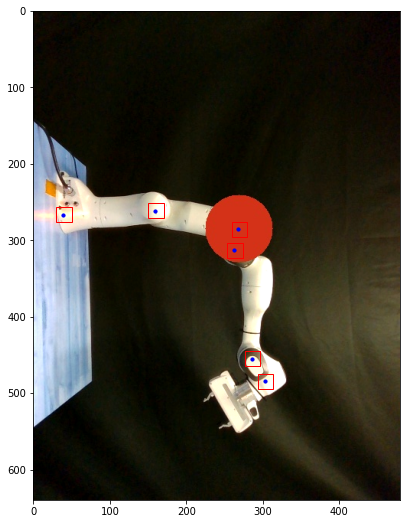

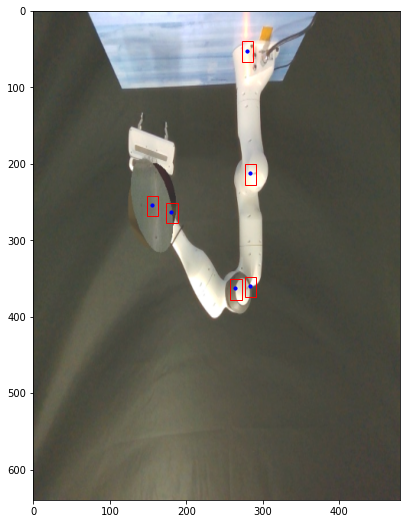

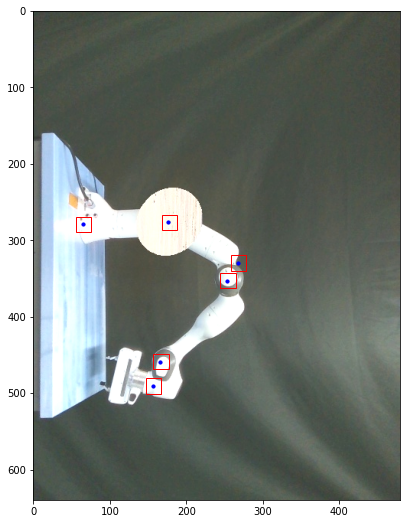

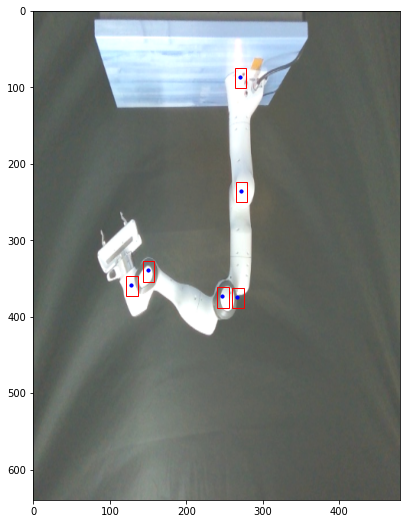

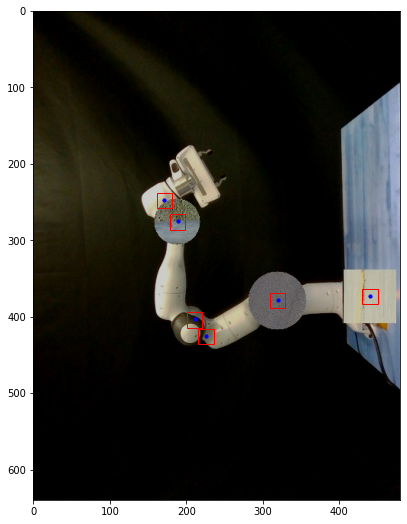

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_data(data_loader, num_images=5):
    """
    Visualize images with bounding boxes and keypoints.
    
    Parameters:
    - data_loader (torch.utils.data.DataLoader): DataLoader for your dataset.
    - num_images (int): Number of images to visualize.
    """
    for i, (images, targets) in enumerate(data_loader):

        # Stop the visualization after displaying the desired number of images
        if i >= num_images:
            break
        
        image = images[0].numpy().transpose(1,2,0) # Assuming the DataLoader provides batched data
        target = targets[0]
        
        fig, ax = plt.subplots(1, figsize=(12,9))
        ax.imshow(image)

        # Draw bounding boxes
        boxes = target['boxes'].numpy()
        for box in boxes:
            rect = patches.Rectangle((box[0],box[1]),box[2]-box[0],box[3]-box[1], linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
        
        # Draw keypoints
        keypoints = target['keypoints'].numpy()
        for kp_set in keypoints:
            for kp in kp_set:
                if kp[2] == 1: # check for visibility
                    plt.scatter(kp[0], kp[1], s=10, c='blue', marker='o')
        
        plt.show()

# Call the function
visualize_data(data_loader_train)

In [11]:
def get_model(num_keypoints, weights_path=None):
    
    anchor_generator = AnchorGenerator(sizes=(32, 64, 128, 256, 512), aspect_ratios=(0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 4.0))
    model = torchvision.models.detection.keypointrcnn_resnet50_fpn(weights=False,
                                                                   weights_backbone=True,
                                                                   num_keypoints=num_keypoints,
                                                                   num_classes = 7, # Background is the first class, object is the second class
                                                                   rpn_anchor_generator=anchor_generator)

    if weights_path:
        state_dict = torch.load(weights_path)
        model.load_state_dict(state_dict)        
        
    return model

In [12]:
total_keypoints = 6

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

KEYPOINTS_FOLDER_TRAIN = split_folder_path +"/train" #train_test_split(root_dir) +"/train"
KEYPOINTS_FOLDER_VAL = split_folder_path +"/val"
KEYPOINTS_FOLDER_TEST = split_folder_path +"/test"

dataset_train = ClassDataset(KEYPOINTS_FOLDER_TRAIN, transform=train_transform(), demo=False)
# dataset_train = ClassDataset(KEYPOINTS_FOLDER_TRAIN, transform=None, demo=False)
dataset_val = ClassDataset(KEYPOINTS_FOLDER_VAL, transform=None, demo=False)
dataset_test = ClassDataset(KEYPOINTS_FOLDER_TEST, transform=None, demo=False)

# batch_sizes = [3,2]
# epochs_lst = [30,50,100]

# batch_sizes = [3, 2, 1]
# epochs_lst = [25, 30]
batch_sizes = [8]
epochs_lst = [1]

v = 1

for b_size in batch_sizes:
    for epochs in epochs_lst:
        data_loader_train = DataLoader(dataset_train, batch_size=b_size, shuffle=True, collate_fn=collate_fn)
        data_loader_val = DataLoader(dataset_val, batch_size=1, shuffle=False, collate_fn=collate_fn)
        data_loader_test = DataLoader(dataset_test, batch_size=1, shuffle=False, collate_fn=collate_fn)

        model = get_model(num_keypoints = total_keypoints)
        model.to(device)

        params = [p for p in model.parameters() if p.requires_grad]
        optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)
        lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.3)
        num_epochs = epochs

        for epoch in range(num_epochs):
            train_one_epoch(model, optimizer, data_loader_train, device, epoch, print_freq=1000)
            lr_scheduler.step()
            
#             if epoch == 25 or epoch == 30 :
#                 PATH = f"/home/jc-merlab/Pictures/Data/trained_models/keypointsrcnn_weights_ld_b{b_size}_e{epoch}_v{v}.pth"        
#                 torch.save(model, PATH)
#                 v+=1 
            
        
        PATH = f"/home/jc-merlab/Pictures/Data/trained_models/keypointsrcnn_weights_panda_occ_b{b_size}_e{epochs}_v{v}.pth"
            
            
        torch.save(model, PATH)

/home/jc-merlab/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/home/jc-merlab/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.S

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.S

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeez

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeez

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeez

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 3])
Shape before matrix multiplication: torch.Size([6, 3])
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape after squeezing: torch.Size([6, 6, 3])
Encountered an unexpected tensor shape. Skipping this tensor...
Shape 

In [7]:
weights_path = '/home/jc-merlab/Pictures/Data/trained_models/keypointsrcnn_weights_panda_occ_b64_e100_v1.pth'
model = torch.load(weights_path).to(device)

# image = Image.open("/home/jc-merlab/Pictures/Data/split_folder_output-2023-10-22/test/images/002510.rgb.jpg")
image = Image.open("/home/jc-merlab/Pictures/Data/occluded_results_old/occluded_12.png")
print(type(image))

image = F.to_tensor(image).to(device)
image.unsqueeze_(0)
print(image.shape)
image = list(image)

with torch.no_grad():
    model.to(device)
    model.eval()
    output = model(image)



<class 'PIL.PngImagePlugin.PngImageFile'>
torch.Size([1, 3, 480, 640])


In [8]:
scores = output[0]['scores'].detach().cpu().numpy()


high_scores_idxs = np.where(scores > 0.7)[0].tolist() # Indexes of boxes with scores > 0.7
post_nms_idxs = torchvision.ops.nms(output[0]['boxes'][high_scores_idxs], output[0]['scores'][high_scores_idxs], 0.3).cpu().numpy() # Indexes of boxes left after applying NMS (iou_threshold=0.3)


keypoints = []
for kps in output[0]['keypoints'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
    keypoints.append(list(map(int, kps[0,0:2])))
    
labels = []
for label in output[0]['labels'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
    labels.append(label)
keypoints_ = [x for _,x in sorted(zip(labels,keypoints))]

print(keypoints_)

print(labels, keypoints, high_scores_idxs, post_nms_idxs)

bboxes = []
for bbox in output[0]['boxes'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
    bboxes.append(list(map(int, bbox.tolist())))

# Dictionary to store the best score for each label and corresponding keypoints and bboxes
best_keypoints = {}
best_bboxes = {}
best_scores = {}

# Iterate through each box after NMS
for idx, label in enumerate(output[0]['labels'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy()):
    score = scores[high_scores_idxs][post_nms_idxs][idx]
    kp = list(map(int, output[0]['keypoints'][high_scores_idxs][post_nms_idxs][idx, 0, 0:2].detach().cpu().numpy()))
    bbox = list(map(int, output[0]['boxes'][high_scores_idxs][post_nms_idxs][idx].detach().cpu().numpy()))

    # Update keypoints and bboxes if this score is better than the previous best score for this label
    if label not in best_scores or score > best_scores[label]:
        best_scores[label] = score
        best_keypoints[label] = kp
        best_bboxes[label] = bbox

# Now, best_keypoints and best_bboxes contain the highest scoring keypoints and bboxes for each label
keypoints_ = [best_keypoints[label] for label in sorted(best_keypoints)]
bboxes = [best_bboxes[label] for label in sorted(best_bboxes)]

# Continue with the rest of your processing
print("Keypoints:", keypoints_)
print("BBoxes:", bboxes)
    
# print("Keypoints", keypoints_)

[[275, 303], [251, 197], [401, 250], [428, 232]]
[5, 6, 2, 3] [[401, 250], [428, 232], [275, 303], [251, 197]] [0, 1, 2, 3] [0 1 2 3]
Keypoints: [[275, 303], [251, 197], [401, 250], [428, 232]]
BBoxes: [[269, 292, 284, 316], [244, 186, 259, 209], [393, 239, 409, 263], [420, 222, 437, 245]]


In [9]:
117, 4, 7, 8, 12

(117, 4, 7, 8, 12)

In [3]:
import cv2
import numpy as np

def visualize_keypoints(image_path, keypoints, bboxes=None, point_radius=5, bbox_color=(0, 0, 255), keypoint_color=(255, 0, 0)):
    """
    Visualize keypoints on the given image.

    Args:
    - image_path (str): Path to the image on which to draw the keypoints.
    - keypoints (list): List of keypoints coordinates [(x1, y1), (x2, y2), ...].
    - bboxes (list, optional): List of bounding boxes, if provided. Each bbox is in the format [xmin, ymin, xmax, ymax].
    - point_radius (int, optional): Radius of the circle used to visualize each keypoint.
    - bbox_color (tuple, optional): Color for bounding boxes in BGR format.
    - keypoint_color (tuple, optional): Color for keypoints in BGR format.
    
    Returns:
    - numpy.ndarray: Image with visualized keypoints.
    """
    
    # Read the image using OpenCV
    image = cv2.imread(image_path)
    
    # Draw bounding boxes if provided
    if bboxes:
        for bbox in bboxes:
            cv2.rectangle(image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), bbox_color, 2)
    
    # Draw keypoints
    for keypoint in keypoints:
        x, y = keypoint
        cv2.circle(image, (x, y), point_radius, keypoint_color, -1)  # -1 fills the circle
    
    return image

# Usage
# image_path = "/home/jc-merlab/Pictures/Data/split_folder_output-2023-10-20/test/images/003754.rgb.jpg"
# image_path = '/home/jc-merlab/Pictures/Data/occluded_results_old/occluded_12.png'
# visualized_image = visualize_keypoints(image_path, keypoints_, bboxes)
# cv2.imshow("Visualized Image", visualized_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()



In [1]:
def visualize_keypoints(image_path, all_keypoints, bboxes=None, point_radius=5, bbox_color=(0, 0, 255), keypoint_color=(255, 0, 0)):
    """
    Visualize keypoints on the given image. Expects keypoints in the format of a list with a flat structure [x1,y1,x2,y2,...]
    for each keypoint set associated with an object.
    """
    image = cv2.imread(image_path)
    
    if bboxes:
        for bbox in bboxes:
            cv2.rectangle(image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), bbox_color, 2)
    
    for keypoints in all_keypoints:
        for i in range(0, len(keypoints), 2):
            x, y = keypoints[i], keypoints[i+1]
            cv2.circle(image, (x, y), point_radius, keypoint_color, -1)
    
    return image

In [2]:
import os
import torch
import torchvision
import numpy as np
from torchvision.transforms import functional as F
from PIL import Image
import cv2

# Function to perform detection on one image
def detect_and_visualize(model, image_path, device, detection_threshold=0.7, nms_iou_threshold=0.3, visualize=False):
    image = Image.open(image_path)
    image_tensor = F.to_tensor(image).to(device)
    keypoints_detected = 0

    with torch.no_grad():
        model.to(device)
        model.eval()
        output = model([image_tensor])

    scores = output[0]['scores'].detach().cpu().numpy()
    high_scores_idxs = np.where(scores > detection_threshold)[0]
    post_nms_idxs = torchvision.ops.nms(output[0]['boxes'][high_scores_idxs], 
                                        output[0]['scores'][high_scores_idxs], 
                                        nms_iou_threshold).cpu().numpy()

    keypoints = []
    for kps in output[0]['keypoints'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
        keypoints.append(list(map(int, kps[:, :2].flatten())))  # assuming kps is of shape [num_keypoints, 3]

    if len(keypoints) == 10:
        keypoints_detected = 1

    bboxes = []
    for bbox in output[0]['boxes'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
        bboxes.append(list(map(int, bbox.tolist())))

    if visualize:
        visualized_image = visualize_keypoints(image_path, keypoints, bboxes)
        return keypoints_detected, visualized_image

    return keypoints_detected, None

# Define the folder path containing the images
folder_path = '/home/jc-merlab/Pictures/Data/2D_15k/'

# Load the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
weights_path = '/home/jc-merlab/Pictures/Data/trained_models/keypointsrcnn_weights_ld_b1_e25_v2.pth'
model = torch.load(weights_path).to(device)

# Variables to track the number of images and the number of images with 6 keypoints
total_images = 0
images_with_six_keypoints = 0

# Process all images in the folder
for image_filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, image_filename)
    if os.path.isfile(image_path) and image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        keypoints_detected, visualized_image = detect_and_visualize(model, image_path, device, visualize=True)
        total_images += 1
        images_with_six_keypoints += keypoints_detected

        # Save or display the visualized image
        visualized_image_path = os.path.join(folder_path, 'visualized/', 'vis_' + image_filename)
        cv2.imwrite(visualized_image_path, visualized_image)

# Calculate the percentage of images with 6 keypoints
percentage_with_six_keypoints = (images_with_six_keypoints / total_images) * 100 if total_images > 0 else 0
print(f"Percentage of images with 10 keypoints: {percentage_with_six_keypoints}%")


Percentage of images with 10 keypoints: 78.33310819937863%
